# Predict Blood Donations ConvNet with Keras including Batchnorm, Dropout and Ensemling

Marek Zielinski, 21/08/2017

In [1]:
version = "002"

### TOC

- [1. Introduction](#introduction)
<br><br>
- [2. Data preparation and EDA](#data-preparation)
    - [2.1 Load data](#load-data)
    - [2.2 Reshape image matrices](#Reshape)
    - [2.3 Visualize data](#visualize-data)
    - [2.4 Data normalization](#data-normalization)
    - [2.5 Label one-hot encoding](#label-one-hot-encoding)
    - [2.6 Split data into training and validation set](#split-train-test)
<br><br>
- [3. Models](#models)
    - [3.1 Baseline model (Linear Regression)](#baseline-model)
    - [3.2 Feature engineering](#feature-engineering)
    - [3.3 Random Forest](#random-forest)
    - [3.4 Model architecture](#model-architecture)
<br><br>
- [4. Prediction and evaluation](#evaluation)
    - [4.1 Data augmentation](#data-augmentation)
    - [4.2 Training and validation of a single model](#training-and-validation)
    - [4.3 Ensembling](#ensembling)
    - [4.4 Confusion matrix and classification report](#confusion-matrix)
    

## <a name="introduction"></a>1. Introduction

We want to predict Blood Donations for a given individual next time the vehicle comes to campus. Data was provided by DrivenData as a part of the Predict Blood Donations competition. We will build a simple Convolutional Neural Network and train it to do feature selection based on kernels.

First we load all necessary libraries

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
%matplotlib inline
plt.rcParams["figure.figsize"] = (10,6)

np.random.seed(4321)

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, log_loss
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline

from keras import backend as K
from keras.utils.np_utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Lambda
from keras.layers.convolutional import Conv1D, ZeroPadding1D
from keras.layers.local import LocallyConnected1D
from keras.layers.pooling import MaxPooling1D
from keras.layers.normalization import BatchNormalization
from keras.layers.noise import GaussianNoise
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import Callback, ReduceLROnPlateau, TensorBoard
from keras.metrics import categorical_accuracy, categorical_crossentropy

import itertools
import time

import tensorflow as tf
from tensorboard.plugins.scalar import metadata as scalar_metadata

In [2]:
import dill as pickle

objects_path = "objects/"

def pickle_dump(obj, filename):
    with open(objects_path + filename + '-v-' + version + '.pkl', 'wb') as output:
        pickle.dump(obj, output, pickle.HIGHEST_PROTOCOL)

Manually create tensorflow session to avoid potential OEM errors on laptop's GPU.

In [3]:
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
session = tf.Session(config=config)
K.set_session(session)
K.set_image_dim_ordering('tf')

In [4]:
sns.set(style='dark', context='notebook', palette='GnBu_d')
sns_palette = sns.color_palette("GnBu_d",10)

## <a name="data-preparation"></a>2. Data preparation and EDA

### <a name="load-data"></a>2.1 Load data

We now load training and test data to perform exporatory analysis.

We have 4 numeric columns that can act as predictors and the last is our class column with values 0 and 1. This is a binary classification task.

In [5]:
#Load training and test data
train = pd.read_csv("data/train.csv", index_col=0)
test = pd.read_csv("data/test.csv",index_col=0)
print(train.shape)
train.head(5)

(576, 5)


,Months since Last Donation,Number of Donations,Total Volume Donated (c.c.),Months since First Donation,Made Donation in March 2007
619,2,50,12500,98,1
664,0,13,3250,28,1
441,1,16,4000,35,1
160,2,20,5000,45,1
358,1,24,6000,77,0


In [6]:
train.describe()

,Months since Last Donation,Number of Donations,Total Volume Donated (c.c.),Months since First Donation,Made Donation in March 2007
count,576.000000,576.000000,576.000000,576.000000,576.000000
mean,9.439236,5.427083,1356.770833,34.050347,0.239583
std,8.175454,5.740010,1435.002556,24.227672,0.427200
min,0.000000,1.000000,250.000000,2.000000,0.000000
25%,2.000000,2.000000,500.000000,16.000000,0.000000
50%,7.000000,4.000000,1000.000000,28.000000,0.000000
75%,14.000000,7.000000,1750.000000,49.250000,0.000000
max,74.000000,50.000000,12500.000000,98.000000,1.000000


In [7]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 576 entries, 619 to 74
Data columns (total 5 columns):
Months since Last Donation     576 non-null int64
Number of Donations            576 non-null int64
Total Volume Donated (c.c.)    576 non-null int64
Months since First Donation    576 non-null int64
Made Donation in March 2007    576 non-null int64
dtypes: int64(5)
memory usage: 27.0 KB


We have 576 rows of observations and no missing values

Now we look at count for each class.

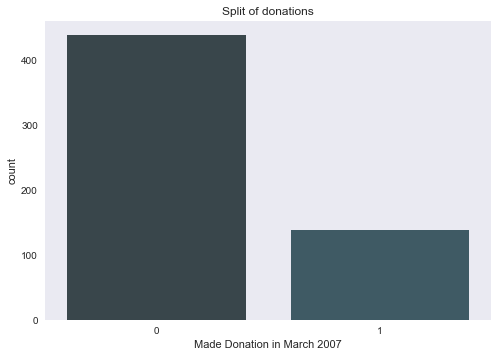

In [8]:
p = sns.countplot(train['Made Donation in March 2007'],palette=sns_palette)
sns.plt.title("Split of donations")
plt.show()

In [9]:
Y_data = train['Made Donation in March 2007']
X_data = train.drop('Made Donation in March 2007',axis=1)

As we can see have very different ranges on our predictor variables. We will use StandardScaler to normalize the data. Default settings are mean=0 and standard deviation of 1.

### <a name="visualize-data"></a>2.3 Visualize data

We now plot pairwise realtions of our data. It looks like `"Number of donation"` is almost perfectly correlated with `"Total Volume Donated"`. Since we want to avoid providing redundant information to our models we will pick `"Number of donations"` and discard `"Total Volume Donated"`. This leaves us with only 3 features.

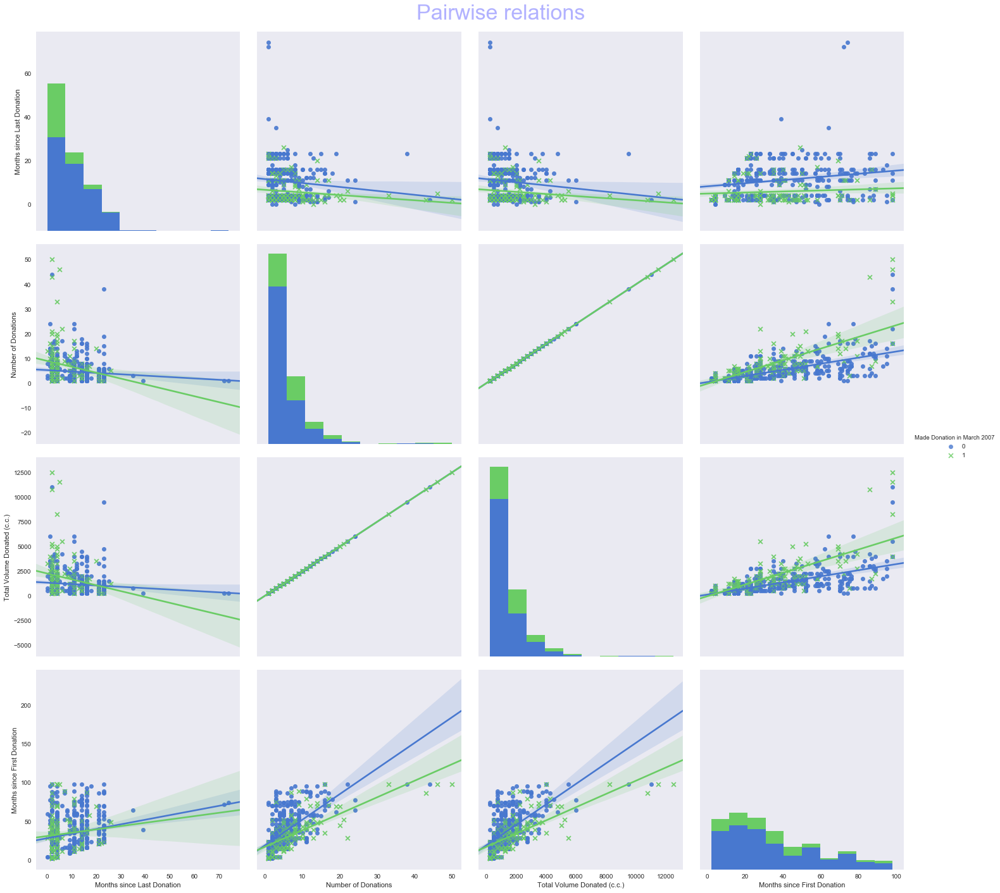

In [10]:
g = sns.pairplot(vars=["Months since Last Donation",
                         "Number of Donations",
                         "Total Volume Donated (c.c.)",
                         "Months since First Donation"
                     ],
                     data=train, hue="Made Donation in March 2007",
                     palette="muted",size=5,
                     kind='reg',markers=['o','x'])

# Change the size of the scatterpoints in graph
g = g.map_offdiag(plt.scatter,  s=35,alpha=0.5)
# Additional line to adjust some title spacing
plt.subplots_adjust(top=0.95)
# Set the Title of the graph
g.fig.suptitle('Pairwise relations',
                fontsize=34,color="b",alpha=0.3)
plt.show()

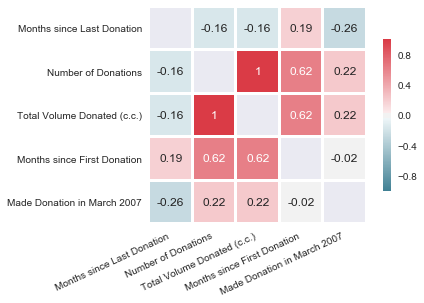

In [11]:
corr = train.corr()
# Generate a mask for the diagonal
mask = np.zeros_like(corr, dtype=np.bool)
np.fill_diagonal(mask,True)
plt.figure(figsize=(6,4))
p = sns.heatmap(corr, xticklabels=corr.columns.values, yticklabels=corr.columns.values, mask=mask, 
                cmap=sns.diverging_palette(220, 10, as_cmap=True), square=True, annot=True, linewidths=2,
                cbar_kws={"shrink": .7}, annot_kws={"size": 12})
for tick in p.get_xticklabels():
    tick.set_rotation(25)
    tick.set_horizontalalignment('right')
plt.show()

The correlation heatmap confirms that variables ```"Number of Donations"```  and ```"Total Volume Donated"``` are perfectly correlated having correlation coefficient of 1.

In [12]:
X_data.drop("Total Volume Donated (c.c.)", inplace = True, axis=1)

### <a name="data-normalization"></a>2.4 Data normalization

As we saw we have very different ranges on our predictor variables. We will use StandardScaler to normalize the data. Default settings are mean=0 and standard deviation of 1.

In [13]:
scaler = StandardScaler()
X_data_n = scaler.fit_transform(X_data)
test_n = scaler.fit_transform(test)

### <a name="label-one-hot-encoding"></a>2.5 Label one-hot encoding

We have 2 classes that we need to one hot encode for the classifiers.

In [14]:
Y_data_cat = to_categorical(Y_data, num_classes = 2)
Y_data_cat[:2]

array([[ 0.,  1.],
       [ 0.,  1.]])

### <a name="split-train-test"></a>2.5 Split data into training and validation set

We will now split our data into training and test sets leaving 70% in the training set and 30% as for validation. We only have 576 observations so we really cannot afford to split it additionaly and have another hold out data.

We will also check the distribution of the classes in the split data. The ```stratify=Y_data``` argument should provide us with similar distribution in both sets. This way we won't have a problem with overrepresentation of some labels.

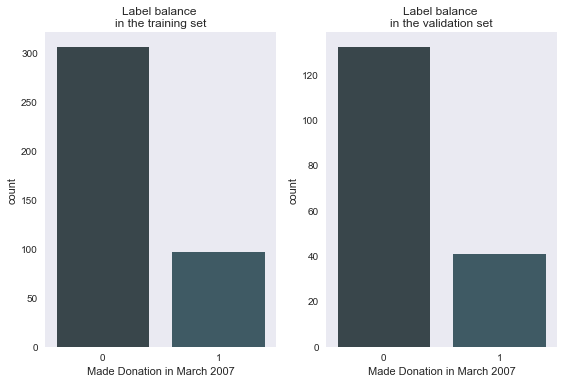

In [15]:
X_train, X_val, Y_train, Y_val = train_test_split(X_data_n, Y_data, train_size=0.7, stratify=Y_data, random_state=4321)

plt.subplot(1,2,1)
sns.countplot(Y_train,palette=sns_palette)
sns.plt.title("Label balance \nin the training set")
plt.subplot(1,2,2)
sns.countplot(Y_val,palette=sns_palette)
sns.plt.title("Label balance \nin the validation set")
plt.tight_layout(w_pad=1)
plt.show()

In [16]:
print("Validation samples: " + str(len(X_val)))

Validation samples: 173


We now do one hot encoding on the training and validation labels.

In [17]:
Y_train_cat = to_categorical(Y_train, num_classes = 2)
Y_val_cat = to_categorical(Y_val, num_classes = 2)

## <a name="models"></a>3. Models

#### helper function: print_metrics(model, X, Y, X_val, Y_val)

We will define a short helper function to display training and validation metrics

In [44]:
def get_bs(preds, Y, metric=None, size=1000):
    if (type(Y) == pd.core.series.Series):
        Y = Y.values
    ids = [np.random.choice(range(len(preds)), len(preds), replace=True) for _ in range(size)]
    return [metric(Y[i],preds[i]) for i in ids] 

def calc_accuracy(preds, Y):
    correct = (preds == Y)
    return sum(correct) / len(correct)

def print_metrics(model, X, Y, X_val, Y_val, size=1000):
    if (type(model) == Sequential):
        model_predict = model.predict
        model_predict_class = model.predict_classes
        model_score = model.evaluate
    else:
        model_predict = model.predict_proba
        model_predict_class = model.predict
        model_score = model.score
        
    training_loss = log_loss(Y, model_predict(X))
    training_accuracy = model_score(X, Y)
    validation_predictions = model_predict(X_val)
    validation_classes = model_predict_class(X_val)
    validation_loss_bs = get_bs(validation_predictions, Y_val, metric = log_loss, size=size)
    validation_accuracy_bs = get_bs(validation_classes, Y_val, metric = calc_accuracy, size=size)
    print("Training loss: " + '{:.4f}'.format(training_loss) 
          + "\t\t Validation Loss median: " + '{:.4f}'.format(np.median(validation_loss_bs)))
    print("Training accuracy: " + '{:.4f}'.format(training_accuracy)
          + "\t Validation accuracy median:" + '{:.4f}'.format(np.median(validation_accuracy_bs)))
    return validation_loss_bs, validation_accuracy_bs

def print_keras_metrics(model, X, Y, X_val, Y_val):
    training_eval = model.evaluate(X, Y)
    training_loss = training_eval[0]
    training_accuracy = training_eval[1]
    validation_eval = model.evaluate(X_val, Y_val)
    validation_loss = validation_eval[0]
    validation_accuracy = validation_eval[1]
    print("Training loss: " + '{:.4f}'.format(training_loss) 
          + "\t\t Validation Loss: " + '{:.4f}'.format(validation_loss))
    print("Training accuracy: " + '{:.4f}'.format(training_accuracy)
          + "\t Validation accuracy:" + '{:.4f}'.format(validation_accuracy))

### Validation set bootstrapping

In [25]:
class DataGenerator():
    
    def __init__(self, X, Y, batch_size=1):
        self.X = X
        if (type(Y_val) == pd.core.series.Series):
            self.Y = Y.values
        else:
            self.Y = Y
        self.n = len(X)
        self.batch_size = batch_size
        
    def __next__(self):
        ids = np.random.choice(range(self.n),self.batch_size)
        X_n = self.X[ids]
        Y_n = self.Y[ids]
        return (X_n, Y_n)
    
    def get_bs(self, n=None):
        if (n == None):
            n = self.n
        ids = np.random.choice(range(self.n), n, replace=True)
        X_n = self.X[ids]
        Y_n = self.Y[ids]
        return (X_n, Y_n)
    

### <a name="baseline-model"></a>3.1 Baseline model (Linear Regression)

First we will create a simple linear regression model to serve as our baseline for future improvements and validation of more complex model architectures. We use sklearn ```LogisticRegression()``` that yields Logloss score of 0.5012 

Training loss: 0.4755		 Validation Loss median: 0.5012
Training accuracy: 0.7593	 Validation accuracy median:0.7688
95% confidence interval for Log loss: [ 0.41864377  0.59179711]


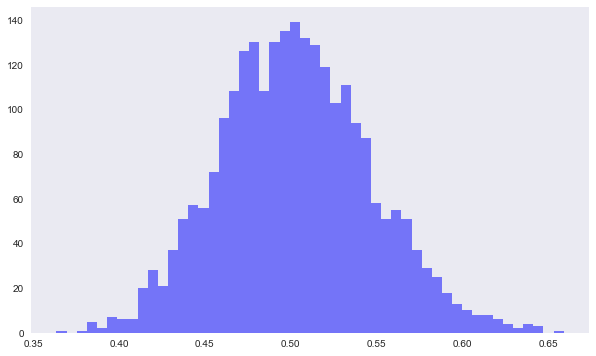

In [47]:
baseline_clf = LogisticRegression()
baseline_clf.fit(X_train,Y_train)
validation_gen1 = DataGenerator(X_val, Y_val, batch_size=100)
np.random.seed(4321)
val_loss_lm, _ = print_metrics(baseline_clf, X_train, Y_train, X_val, Y_val, size = 2500)
print("95% confidence interval for Log loss: " + str(np.percentile(val_loss_lm,[2.5,97.5])))
plt.hist(val_loss_lm, bins=50, alpha=0.5, color='b')
plt.show()

In [35]:
type(Y_val)

pandas.core.series.Series

### <a name="feature-engineering"></a>3.2 Feature engineering

We will now add polynomial features like ```a*b``` or ```a^2``` to our features. When measuring performance below we can see that we get around 0.015 improvement on the training log loss and less than 0.004 improvement on validation log loss. That is very small and it look like we are already overfitting in some cases, bacause the distribution of our bootstrapped validation loss has a longer right tail.

In [51]:
def model_compare(model1, model2, model1_name, model2_name, 
                  x_train, y_train, 
                  x_val, y_val, size=2500):
    print("Model 1:")
    val_loss_model1, _ = print_metrics(model1, x_train, y_train, x_val, y_val , size = size)
    print("95% confidence interval for Log loss: " + str(np.percentile(val_loss_model1,[2.5,97.5])))
    print("Model 2:")
    val_loss_model2, _ = print_metrics(model2, x_train, y_train, x_val, y_val, size = size)
    print("95% confidence interval for Log loss: " + str(np.percentile(val_loss_model2,[2.5,97.5])))
    print("Improvement in Validation Loss median: " + str(np.median(val_loss_model1) - np.median(val_loss_model2)))
    plt.subplots(1,3, figsize=(14,6))
    plt.subplot(1,3,1)
    plt.hist(val_loss_model1, color='b', alpha=0.5, bins=50, normed=True)
    plt.hist(val_loss_model2, color='r', alpha=0.5, bins=50, normed=True)
    plt.legend((model1_name,model2_name))
    plt.xlabel('Validation Log Loss')
    plt.ylabel('Validation Log Loss Distribution')
    plt.subplot(1,3,2)
    plt.plot(*ecdf(val_loss_model1), color='b', alpha=0.5) #marker='.', linestyle='none', markersize=2.5)
    plt.plot(*ecdf(val_loss_model2), color='r', alpha=0.5) #marker='.', linestyle='none', markersize=2.5)
    plt.legend((model1_name,model2_name))
    plt.xlabel('Validation Log Loss')
    plt.ylabel('ECDF')
    plt.subplot(1,3,3)
    df = pd.DataFrame({'Validation loss':np.concatenate([val_loss_model1,val_loss_model2])})
    df['model'] = 1
    df.iloc[0:len(val_loss_model1),1] = 0
    pal = {model: "b" if model == 0 else "r" for model in df.model.unique()}
    sns.boxplot(data = df, y='Validation loss', x='model', palette=pal)
    plt.xticks(plt.xticks()[0],(model1_name,model2_name))
    plt.show()
    conf_int = conf_interval(val_loss_model1, val_loss_model2, n=10000)
    print("95% confidence interval for difference of medians: " + str(conf_int))
    p = stats.mannwhitneyu(val_loss_model1, val_loss_model2, alternative='greater')[1]
    print("Mann-Whitney U test p-value: " + '{:.6f}'.format(p))

In [75]:
def model_list_compare(model_list, model_names,  
                  x_train=None, y_train=None, val_gen=None, size=2500):
    val_loss_model = []
    for i in range(len(model_list)):
        print("Model " + str(i+1) + " " + model_names[i])
        v, _ = print_metrics(model_list[i], x_train, y_train, val_gen.X, val_gen.Y, size = size)
        val_loss_model.append(v)
        print("95% confidence interval for Log loss: " + str(np.percentile(v,[2.5,97.5])))
        if (i > 0):
            print("Improvement in Validation Loss median: " + str(np.median(val_loss_model[i-1]) - np.median(val_loss_model[i])))
            conf_int = conf_interval(val_loss_model[i-1], val_loss_model[i], n=10000)
            print("95% confidence interval for difference of medians: " + str(conf_int))
            p = stats.mannwhitneyu(val_loss_model[i-1], val_loss_model[i], alternative='greater')[1]
            print("Mann-Whitney U test p-value: " + '{:.6f}'.format(p))
    sns_pal = sns.color_palette("Set1", n_colors=8, desat=.5)
    sns.set(style='dark', context='notebook', palette=sns_pal)
    plt.subplots(1,3, figsize=(14,6))
    plt.subplot(1,3,1)
    for i in range(len(model_list)):
        sns.distplot(val_loss_model[i], hist_kws={"alpha": 0.5}, bins=50, norm_hist=True)
    plt.legend(model_names)
    plt.xlabel('Validation Log Loss')
    plt.ylabel('Validation Log Loss Distribution')
    plt.subplot(1,3,2)
    for i in range(len(model_list)):
        plt.plot(*ecdf(val_loss_model[i]), alpha=0.5, marker='o', markersize=5) # linestyle='none')
    plt.legend(model_names)
    plt.xlabel('Validation Log Loss')
    plt.ylabel('ECDF')
    plt.subplot(1,3,3)
    df_list = [pd.DataFrame({'Validation loss': v, 'model':i}) for i,v in enumerate(val_loss_model)]  
    df = pd.concat(df_list)
    #pal = {model: "b" if model == 0 else "r" for model in df.model.unique()}
    sns.boxplot(data = df, y='Validation loss', x='model', palette=sns_pal)
    plt.xticks(plt.xticks()[0],model_names)
    plt.show()


In [58]:
#helper functions
def bootstrap_replicate_1d(data, func):
    return func(np.random.choice(data, size=len(data)))

def draw_bs_reps(data, func, size=1):
    """Draw bootstrap replicates."""
    bs_replicates = np.empty(size)
    for i in range(size):
        bs_replicates[i] = bootstrap_replicate_1d(data,func)
    return bs_replicates

def conf_interval(x,y,func=np.median,n=1000):
    v1_bs = draw_bs_reps(x,np.median,size=n)
    v2_bs = draw_bs_reps(y,np.median,size=n)
    bs_diff = v1_bs - v2_bs
    conf_int = np.percentile(bs_diff,[2.5,97.5]) 
    return conf_int

def ecdf(data):
    """Compute ECDF for a one-dimensional array. (Empirical Cumulative Distribution Function).
    
    Args:
        param1(numpy.array) -- Data for ECDF
    
    Returns:
        x,y as numpy.array - x -- x-axis values for ECDF, y -- y-axis values for ECDF"""
    n = len(data)
    #Sorted data to x axis
    x = np.sort(data)
    #ECDF data to y axis
    y = np.arange(1,n+1) / n
    return x,y

Model 1:
Training loss: 0.4755		 Validation Loss median: 0.5012
Training accuracy: 0.7593	 Validation accuracy median:0.7688
95% confidence interval for Log loss: [ 0.41864377  0.59179711]
Model 2:
Training loss: 0.4606		 Validation Loss median: 0.4965
Training accuracy: 0.7891	 Validation accuracy median:0.7746
95% confidence interval for Log loss: [ 0.40839187  0.59658569]
Improvement in Validation Loss median: 0.00469168854882


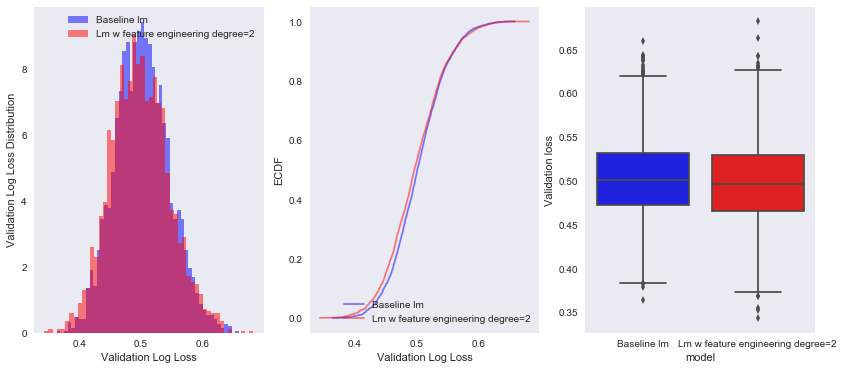

95% confidence interval for difference of medians: [ 0.00155478  0.00817459]
Mann-Whitney U test p-value: 0.000316


In [59]:
feature_engineer = PolynomialFeatures(degree=2)
#X_train_f = feature_engineer.fit_transform(X_train)
#X_val_f = feature_engineer.transform(X_val)
#print("Number of features: " + str(X_train.shape[1]))

clf_f = Pipeline([
    ('feature_engineer', feature_engineer),
    ('model', LogisticRegression())
    ])
clf_f.fit(X_train,Y_train)
np.random.seed(4321)
model_compare(baseline_clf, clf_f, "Baseline lm", "Lm w feature engineering degree=2",
             X_train, Y_train,
             X_val, Y_val)

Let's perform a Mann-Whitney U test so we can reject the null hypothesis that the medians are the same. Our alternative is that we indeed have an improvement and the median log loss of the first model is greater than the median of the second model. We get a p-value of 0.0005 which is significantly below 99% treshold. The model did improve. Next we create confidence interval for the difference in medians.

We can try to add a higher degree features, however when we measure log loss we see that while we improved training log loss by around 0.01 our validation log loss rose by 0.1. We are heavily overfitting using this model. We will stick to the 0.5 benchmark for future improvements. We can try to use higher degree features with better regularized models or with models that have built in feature selection, like Random Forest.

Model 1:
Training loss: 0.4606		 Validation Loss median: 0.4975
Training accuracy: 0.7891	 Validation accuracy median:0.7746
95% confidence interval for Log loss: [ 0.41258056  0.59179913]
Model 2:
Training loss: 0.4472		 Validation Loss median: 0.5928
Training accuracy: 0.7990	 Validation accuracy median:0.7977
95% confidence interval for Log loss: [ 0.41300863  0.92843064]
Improvement in Validation Loss median: -0.095279215303


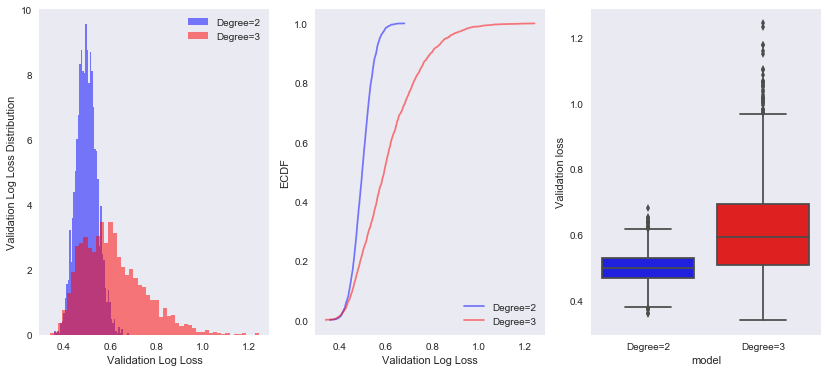

95% confidence interval for difference of medians: [-0.10060378 -0.08848169]
Mann-Whitney U test p-value: 1.000000


In [64]:
feature_engineer3 = PolynomialFeatures(degree=3)
X_train_f3 = feature_engineer3.fit_transform(X_train)
X_val_f3 = feature_engineer3.transform(X_val)

clf_f3 = Pipeline([
    ('feature_engineer', feature_engineer3),
    ('model', LogisticRegression())
    ])

clf_f3.fit(X_train,Y_train)
np.random.seed(4321)
model_compare(clf_f, clf_f3, "Degree=2", "Degree=3",
             X_train, Y_train,
             X_val, Y_val)

Model 1:
Training loss: 0.4606		 Validation Loss median: 0.4975
Training accuracy: 0.7891	 Validation accuracy median:0.7746
95% confidence interval for Log loss: [ 0.41258056  0.59179913]
Model 2:
Training loss: 0.4472		 Validation Loss median: 0.5891
Training accuracy: 0.7990	 Validation accuracy median:0.7977
95% confidence interval for Log loss: [ 0.41278531  0.91496793]
Improvement in Validation Loss median: -0.0915914857975


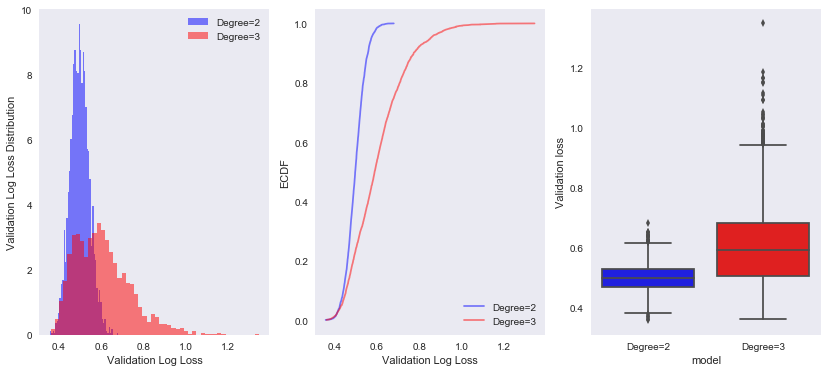

95% confidence interval for difference of medians: [-0.09795597 -0.08618536]
Mann-Whitney U test p-value: 1.000000


In [179]:
validation_gen3 = DataGenerator(X_val_f3, Y_val, batch_size=100)
np.random.seed(4321)
model_compare(clf, clf3, "Degree=2", "Degree=3",
             X_train_f, Y_train, X_train_f3, Y_train, 
             val_gen1 = validation_gen2, val_gen2 = validation_gen3)

### <a name="random-forest"></a>3.3 Random Forest

Now let's try to use Random Forest Classifier. Our training log loss fell by around 0.07 but our validation log loss is more or less the same. However our validation accuracy score actually gone up. This might indicate that our model is too confident and log loss score penalizes wrong and confident predictions. We can try to clip the probabilities to around 0.14 and 0.86 roughly based on our training accuracy, which gets us a slightly better validation log loss score.

Model 1 Degree=2
Training loss: 0.4606		 Validation Loss median: 0.4990
Training accuracy: 0.7891	 Validation accuracy median:0.7746
95% confidence interval for Log loss: [ 0.41381795  0.59141017]
Model 2 Random Forest
Training loss: 0.4169		 Validation Loss median: 0.4918
Training accuracy: 0.8362	 Validation accuracy median:0.7803
95% confidence interval for Log loss: [ 0.41470156  0.57597237]
Improvement in Validation Loss median: 0.00725312485886
95% confidence interval for difference of medians: [ 0.00287567  0.01224466]
Mann-Whitney U test p-value: 0.000956
Model 3 RF Features
Degree=2
Training loss: 0.3950		 Validation Loss median: 0.4957
Training accuracy: 0.8387	 Validation accuracy median:0.7746
95% confidence interval for Log loss: [ 0.41023791  0.58220739]
Improvement in Validation Loss median: -0.00395563237716
95% confidence interval for difference of medians: [ -8.55873332e-03  -4.26339071e-08]
Mann-Whitney U test p-value: 0.986368


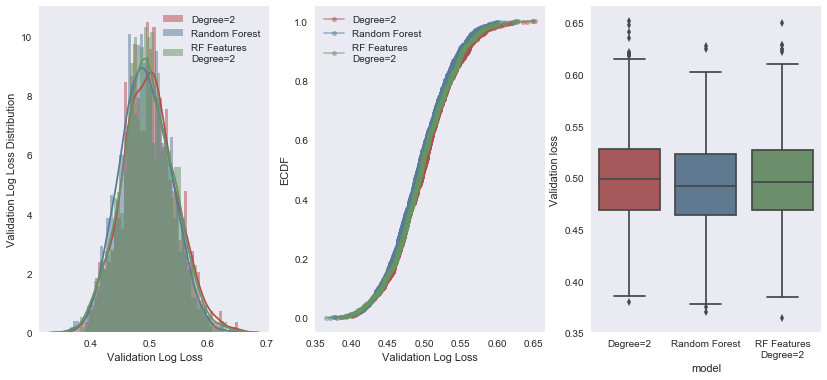

In [78]:
rf_clf = RandomForestClassifier(n_estimators=100, max_depth=4, max_features='auto', random_state=344)
rf_clf.fit(X_train, Y_train)

rf_clf_f = Pipeline([
        ('Feature engineering', feature_engineer),
        ('model', RandomForestClassifier(n_estimators=100, max_depth=4, max_features='auto', random_state=344))
    ])
rf_clf_f.fit(X_train, Y_train)

np.random.seed(4321)
model_list_compare([clf_f, rf_clf, rf_clf_f], ["Degree=2", "Random Forest", "RF Features\nDegree=2"],
             X_train, Y_train,
             val_gen = validation_gen, size=1000)

### Callbacks

Before we train the next model let's define a callback for Keras that after every batch will save the log with some usefull information about training history.

In [79]:
class LossHistory(Callback):
    def on_train_begin(self, logs={}):
        self.loss = []
        self.accuracy = []
        self.epoch_loss = []
        self.epoch_accuracy = []
        self.val_loss = []
        self.val_accuracy = []
        self.batches_size = []
        self.batches_size_epoch = []
        self.samples_shown = []
        self.epoch_lr = []

    def on_batch_end(self, batch, logs={}):
        self.loss.append(logs.get('loss'))
        self.accuracy.append(logs.get('acc'))
        self.batches_size.append(logs.get('size'))
        self.batches_size_epoch.append(logs.get('size'))
        
    def on_epoch_end(self, epoch, logs={}):
        self.epoch_loss.append(logs.get('loss'))
        self.epoch_accuracy.append(logs.get('acc'))
        self.val_loss.append(logs.get('val_loss'))
        self.val_accuracy.append(logs.get('val_acc'))
        self.samples_shown.append(np.sum(self.batches_size_epoch))
        self.batches_size_epoch = []
        self.epoch_lr.append(K.get_value(self.model.optimizer.lr))
        
history_callback = LossHistory()

And another callback that will save the best model during training.

In [80]:
class ModelSave(Callback):
    def __init__(self, max_val_acc=0, treshold=0.8, use_metric='both'):
        self.max_val_accuracy = 0
        self.min_val_loss = np.inf
        self.treshold = treshold
        self.best_model_weights = None
        self.use_metric = use_metric
    
    def Reset(self):
        self.max_val_accuracy = 0
        self.min_val_loss = np.inf
        self.best_model_weights = None
        
    def on_epoch_end(self, epoch, logs={}):
        v_acc = logs.get('val_acc')
        v_loss = logs.get('val_loss')
        if (self.use_metric == 'both'):
            if ((v_acc > self.treshold) and ((v_acc > self.max_val_accuracy) or (v_loss < self.min_val_loss))):
                if (v_acc > self.max_val_accuracy):
                    self.max_val_accuracy = v_acc
                if (v_loss < self.min_val_loss):
                     self.min_val_loss = v_loss
                self.best_model_weights = self.model.get_weights()
                #self.model.save_weights(model_path + 'temp-max-val-acc-cnn-mnist-v' + version +'.pkl')
        elif (self.use_metric == 'loss'):
            if (v_loss < self.min_val_loss):
                self.min_val_loss = v_loss
                self.best_model_weights = self.model.get_weights()
        elif (self.use_metric == 'acc' or self.use_metric == 'accuracy'):
            if (v_acc > self.max_val_accuracy):
                self.max_val_accuracy = v_acc
                self.best_model_weights = self.model.get_weights()
        
model_save_callback = ModelSave()

In [81]:
class MyTensorBoard(Callback):
    """Logging metrics for tensorboard"""
    
    def __init__(self, log_dir):
        self.log_dir = log_dir

    def set_model(self, model):
        self.model = model
        self.sess = K.get_session()
        self.merged = tf.summary.merge_all()
        self.writer = tf.summary.FileWriter(self.log_dir)
        
    def on_epoch_end(self, epoch, logs={}):
        for name, value in logs.items():
            if name in ['batch','size']:
                continue
            summary = tf.Summary()
            summary_value = summary.value.add(tag=name, 
                                              simple_value=value.item())
            summary_value.tag = name
            self.writer.add_summary(summary, epoch)
        self.writer.flush()
        
    def on_train_end(self, logs={}):
        self.writer.close()

### Plot metrics functions

In [82]:
def plot_metric(x1, x2, y1, y2, y3, lr=None, kind='LogLoss', func_type='Min', 
                label1='Training', label2='Validation', subplot_loc=1,
               title=None,annotations=True,
               unit = 'images'):
    """Creates a plot for a given metric"""
    if (func_type == 'Min'):
        func = np.min
    elif (func_type == 'Max'):
        func = np.max
    plt.subplot(2,2,subplot_loc)
    plt.plot(x1, y1, color = 'b', label = label1 + ' ' + kind + ' per batch', linewidth=4, alpha=0.4)
    plt.plot(x2, y3, color = 'b', label = label1 + ' ' + kind + ' per epoch', linewidth=4)
    plt.plot(x2, y2, color='r', label = label2 + ' ' + kind, linewidth=4)
    if (title == None):
        plt.title(kind + ' vs number of training ' + unit, fontsize=60)
    else:
        plt.title(title + ' vs number of training ' + unit, fontsize=60)
    plt.xlabel('Number of ' + unit, fontsize=50)
    plt.ylabel(kind, fontsize=50)
    if (annotations):
        axes = plt.gca()
        y_min = axes.get_ylim()[0]
        y_range = axes.get_ylim()[1] - y_min
        plt.annotate(func_type + " " + label1 + " " + kind + ": " + '{:.4f}'.format(func(y3)), 
                 xy=(np.max(x1) * 0.6, y_min + y_range * 0.68),
                 fontsize=40, clip_on=True)
        plt.annotate("Last " + label1 + " " + kind + ": "  + '{:.4f}'.format(y3[-1]), 
                 xy=(np.max(x1) * 0.6, y_min + y_range * 0.60),
                 fontsize=40, clip_on=True) 
        plt.annotate(func_type + " " + label2 + " " + kind + ": " + '{:.4f}'.format(func(y2)), 
                 xy=(np.max(x1) * 0.6, y_min + y_range * 0.52),
                 fontsize=40, clip_on=True)
        plt.annotate("Last " + label2 + " " + kind + ": "  + '{:.4f}'.format(y2[-1]), 
                 xy=(np.max(x1) * 0.6, y_min + y_range * 0.44),
                 fontsize=40, clip_on=True)    
    plt.legend(loc='best', fontsize=40)
    plt.tick_params(axis='both', which='major', labelsize=40)
    if (lr != None):
        ax = plt.gca()
        ax1 = ax.twinx()
        ax1.set_yscale("log", nonposy='clip')
        ax1.bar(x2,lr, color='g', alpha=0.1, width= (x1[1]-x1[0]) * 2)
        ax1.set_ylabel('Learning reate', fontsize=40)
        ax1.tick_params(axis='both', which='major', labelsize=40)

In [86]:
def plot_metrics(history, show_range=[0.75, 1], unit='samples'):
    """Creates plots for all logged metrics in history object"""
    #build x values for batches and epochs
    x_batches = np.cumsum(history.batches_size)
    x_epochs = np.cumsum(history.samples_shown)
    #build ranges to show on 2nd plot
    x1_batches = int(len(x_batches) * show_range[0])
    x2_batches = int(len(x_batches) * show_range[1])
    x1_epochs = int(len(x_epochs) * show_range[0])
    x2_epochs = int(len(x_epochs) * show_range[1])

    plt.figure(figsize=(56,32))
    plot_metric(x_batches, x_epochs, history.loss, history.val_loss, history.epoch_loss, unit = unit,
                lr = history.epoch_lr
               )
    plot_metric(x_batches[x1_batches:x2_batches], x_epochs[x1_epochs:x2_epochs], 
                history.loss[x1_batches:x2_batches], 
                history.val_loss[x1_epochs:x2_epochs],
                history.epoch_loss[x1_epochs:x2_epochs],
                lr = history.epoch_lr[x1_epochs:x2_epochs],
                kind = 'LogLoss', func_type="Max", subplot_loc=2,
                title = 'Last LogLoss measures',
                annotations=False, unit = unit
               )
    #plt.subplot(3,2,3)
    #plt.bar(range(len(x_epochs)),history.epoch_lr, color='g', alpha=0.5)
    #plt.xlabel('Epoch')
    #plt.ylabel('Learning rate')
    #ax = plt.gca()
    #ax.set_yscale("log", nonposy='clip')
    plot_metric(x_batches, x_epochs, history.accuracy, history.val_accuracy, history.epoch_accuracy,
                lr = history.epoch_lr,
                kind = 'Accuracy', func_type="Max", subplot_loc=3, unit = unit
               )
    plot_metric(x_batches[x1_batches:x2_batches], x_epochs[x1_epochs:x2_epochs], 
                history.accuracy[x1_batches:x2_batches], 
                history.val_accuracy[x1_epochs:x2_epochs],
                history.epoch_accuracy[x1_epochs:x2_epochs],
                lr = history.epoch_lr[x1_epochs:x2_epochs],
                kind = 'Accuracy', func_type="Max", subplot_loc=4,
                title = 'Last Accuracy measures',
                annotations=False, unit = unit
               )

### <a name="Simple Neural-Net"></a>3.4 Simple Neural-Net

In [83]:
def nn_model(dropouts = [0.1,0.5],features=3):
    model = Sequential([
        Dense(30, activation = 'relu', input_shape=(features,)),
        BatchNormalization(),
        Dropout(dropouts[0]),
        Dense(60, activation = 'relu'),
        BatchNormalization(),
        Dropout(dropouts[1]),
        Dense(2, activation = 'softmax')
    ])
    model.compile(Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [84]:
model_nn = nn_model()
model_save_callback_nn = ModelSave(use_metric='loss')
K.set_value(model_nn.optimizer.lr, 0.1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.3,
              patience=6, min_lr=0.00000000001)
history_nn = model_nn.fit(X_train, Y_train_cat, epochs=80,
             batch_size = 64,
                        validation_data=(X_val,Y_val_cat), 
                        verbose=0,
                        callbacks = [reduce_lr, history_callback, model_save_callback_nn]
                           )

True

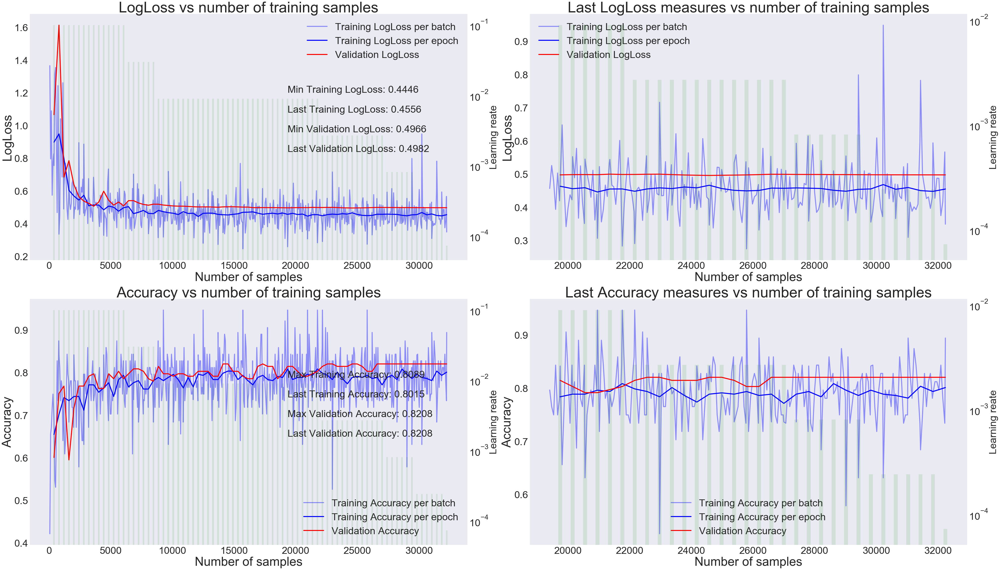

In [87]:
#Plot the loss curves for training and validation
plot_metrics(history_callback, show_range = [0.6,1])
plt.tight_layout()

Our model can't get past training and validation loss of around 0.50 which means that we need to try a more complex architecure.

### ConvNet model

In [88]:
def cnn_model(dropouts = [0, 0.1, 0.1, 0.25, 0.25], features=3):
    """Builds and compiles Keras model for CNN with provided dropouts"""
    model = Sequential([
        ZeroPadding1D(input_shape=(features,1)),
        LocallyConnected1D(12,3, activation='relu'),
        BatchNormalization(axis=1),
        Dropout(dropouts[0]),
        ZeroPadding1D(),
        LocallyConnected1D(24, 3, activation='relu'),
        BatchNormalization(axis=1),
        Dropout(dropouts[1]),
        ZeroPadding1D(),
        LocallyConnected1D(24, 3, activation='relu'),
        BatchNormalization(axis=1),
        Dropout(dropouts[1]),
        Flatten(),
        Dropout(dropouts[2]),
        Dense(96, activation='relu'),
        BatchNormalization(),
        Dropout(dropouts[3]),
        Dense(96, activation='relu'),
        BatchNormalization(),
        Dropout(dropouts[4]),
        Dense(2,activation='softmax')
    ])
    model.compile(Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

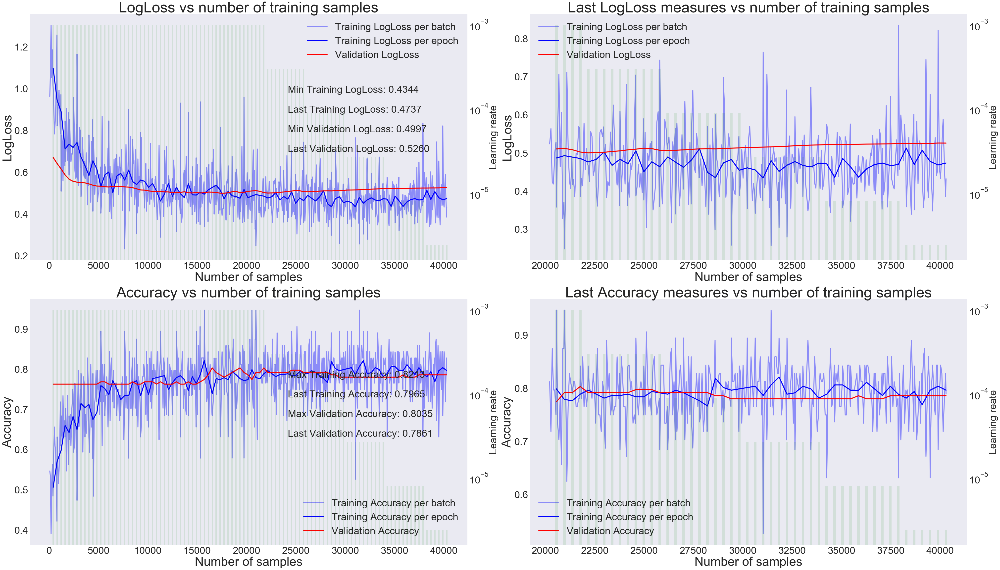

In [90]:
model_cnn = cnn_model()
model_save_callback_cnn = ModelSave(use_metric='loss')
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.3,
              patience=10, min_lr=0.000000000001)
model_cnn.fit(X_train.reshape(-1,X_train.shape[1],1), Y_train_cat, epochs=100, 
                batch_size = 64,
                validation_data=(X_val.reshape(-1,X_val.shape[1],1),Y_val_cat), 
                verbose=0,
                callbacks = [reduce_lr,history_callback, model_save_callback_cnn]
             )
plot_metrics(history_callback, show_range=[0.5, 1], unit='samples')
plt.tight_layout()

We seem to be overfitting after about 60 epochs and it also seems like the main problem is that we have very few data. Let's address that in the next section introducing data augmentation and bootstrapping.

In [ ]:
#pickle_dump(model.get_config(),'cnn-model-get_config-dump')

Now let's look at our ConvNet model as a graph.

In [ ]:
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
SVG(model_to_dot(model_cnn).create(prog='dot', format='svg'))

## <a name="evaluation"></a>4. Further improvements

In [33]:
batch_size=50

### <a name="data-augmentation"></a>4.1 Data augmentation

We now build a generator for the our data that will generate batches of data with added noise. We will use it to generate more training samples with slightly modified features, thus allowing our models to better generalize on unseen data. We implement smooth bootstrapping which means that we will draw a bootstrap sample with replacement from our data with normally distributed zero centered noise.

In [34]:
class DataGenerator():
    def __init__(self, X, Y, ranges=[0], batch_size=1, reshape_x = True):
        self.X = X
        self.Y = Y
        self.ranges = ranges
        self.batch_size = batch_size
        self.n = len(X)
        self.n_batches = self.n // self.batch_size
        self.reshape_x = reshape_x
        
    def __iter__(self):
        return self    
    
    def __next__(self):
        ids = np.random.choice(range(self.n),self.batch_size)
        X_n = self.X[ids]
        Y_n = self.Y[ids]
        X_n = self.modify(X_n)
        if (self.reshape_x):
            X_n = X_n.reshape(-1,X_n.shape[1],1)
        return (X_n, Y_n)
    
    def get_batch(self, size=32):
        ids = np.random.choice(range(self.n),size, replace=True)
        X_n = self.X[ids]
        Y_n = self.Y[ids]
        X_n = self.modify(X_n)
        if (self.reshape_x):
            X_n = X_n.reshape(-1,X_n.shape[1],1)
        return (X_n, Y_n) 
    
    def get_bs(self, n=None):
        if (n == None):
            n = self.n
        return get_batch(size=n)
    
    def flow(self, X,Y, b_size, reshape_x = True):
        self.batch_size = b_size
        self.n = len(X)
        while 1:
          # Generate batches
          ids = np.random.choice(range(len(X)),batch_size)
          X_n = X[ids]
          Y_n = Y[ids]
          X_n = self.modify(X_n)
          if (reshape_x):
              X_n = X_n.reshape(-1,X_n.shape[1],1)
          yield X_n, Y_n
        
    def modify(self, X):
        dx = np.array([np.random.normal(scale=x,size=len(X)) for x in self.ranges])
        return X + dx.swapaxes(1,0)

In [35]:
def get_batches(X,Y, pct_of_train_batches = 0.3, reshape_x = True):
    #genAug = ImageDataGenerator(rotation_range=5, width_shift_range=0.05, shear_range=0.05,
    #                         height_shift_range=0.05, zoom_range=0.05)
    
    batches = DataGenerator(X, Y, batch_size = batch_size, reshape_x = reshape_x, ranges=np.zeros(X.shape[1]))
    batches_aug = DataGenerator(X, Y, 
                                batch_size = batch_size, reshape_x = reshape_x, ranges=np.repeat(0.05, X.shape[1]))
    print("Number of training batches per epoch: " + str(batches.n_batches))
    return batches, batches_aug 
    
batches, batches_aug = get_batches(X_train, Y_train_cat, pct_of_train_batches = 1)
val_batches, val_batches_aug = get_batches(X_val, Y_val_cat, pct_of_train_batches = 1)
batches_nn, batches_aug_nn = get_batches(X_train, Y_train_cat, pct_of_train_batches = 1, reshape_x = False)
val_batches_nn, val_batches_aug_nn = get_batches(X_val, Y_val_cat, pct_of_train_batches = 1, reshape_x = False)

batches_f, batches_aug_f = get_batches(X_train_f, Y_train_cat, pct_of_train_batches = 1)
val_batches_f, val_batches_aug_f = get_batches(X_val_f, Y_val_cat, pct_of_train_batches = 1)
batches_nn_f, batches_aug_nn_f = get_batches(X_train_f, Y_train_cat, pct_of_train_batches = 1, reshape_x = False)
val_batches_nn_f, val_batches_aug_nn_f = get_batches(X_val_f, Y_val_cat, pct_of_train_batches = 1, reshape_x = False)


Number of training batches per epoch: 8
Number of training batches per epoch: 3
Number of training batches per epoch: 8
Number of training batches per epoch: 3
Number of training batches per epoch: 8
Number of training batches per epoch: 3
Number of training batches per epoch: 8
Number of training batches per epoch: 3


### <a name="training-and-validation"></a>4.2 Training and validation of a single model

The approach that we have chosen 
First we try a few epochs with default learning rate and no data augmentation. Most of the time it's the best approach. We try to do it without Augmentation first to make sure that the model does not get stuck on predicting the same class for every input.
After a few tries the most promising approach was to start training the model without data augmentation for a few epochs. Then we try to confuse the model with data augmentation and then again we train the model using the original training data.

### function for training single model

In [36]:
model_path = 'models/'

In [53]:
def train_model(model, batches, validation_data, model_code="M1", 
                       validation_steps=1, epochs=10, 
                       start_lr=0.1, use_metric='loss', patience=8,
                       factor=0.3, save=True):
    print("Training model: " + model_code)
    history = LossHistory()
    model_save_callback = ModelSave(use_metric=use_metric)
    K.set_value(model_nn.optimizer.lr, start_lr)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=factor,
              patience=patience, min_lr=0.00000000001)
    tBoard1 = MyTensorBoard(log_dir='graph9\\train')
    #tBoard = TensorBoard(log_dir='graph6\\train', write_graph=False, histogram_freq=5, write_images=True)
    #tBoard.set_model(model)
    start_time = time.monotonic()
    model.fit_generator(batches, epochs=epochs, 
                            steps_per_epoch = batches.n_batches,
                            validation_data = validation_data,
                            validation_steps = validation_steps, 
                            verbose=0,
                            callbacks = [reduce_lr,history, model_save_callback, tBoard1]
                           )
    model_time = time.monotonic() - start_time
    print("Model training time: " + '{:d}'.format(int(model_time // 60)) + " minutes " 
      + '{:.1f}'.format(model_time % 60) + " seconds")
    
    plot_metrics(history, show_range=[0.5, 1], unit='samples')
    plt.tight_layout()
    #load best model weights
    if ((model_save_callback.best_model_weights != None) and (model_save_callback.max_val_accuracy > 0)):
        print("\nRetrieving best model weights with validation loss: " + str(model_save_callback.min_val_loss))
        model.set_weights(model_save_callback.best_model_weights)
        #model.load_weights(model_path + 'temp-max-val-acc-cnn-mnist-v' + version +'.pkl')

    if (save):
        print("\nSaving weights for model " + model_code)
        model.save_weights(model_path + model_code +'.pkl')
    return model, history, model_save_callback

### Model Training

### Simple NN

In [ ]:
#model_nn2.summary()

Training model: NN2_v01
Model training time: 0 minutes 8.3 seconds

Saving weights for model NN2_v01


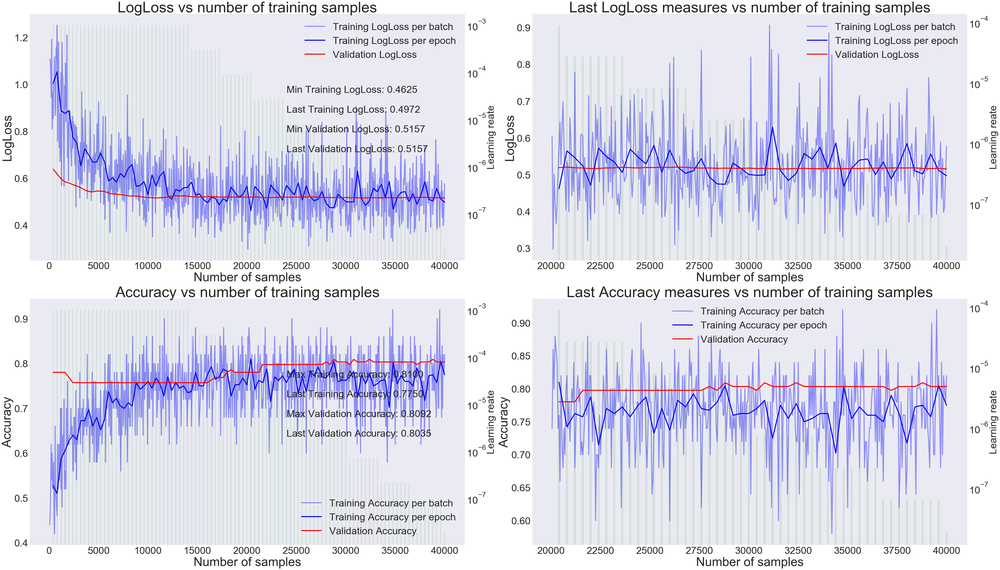

In [59]:
model_nn2 = nn_model()
model_nn2, history_nn2, model_save_nn2 = train_model(model_nn2, batches_aug_nn_f, validation_data=(X_val_f,Y_val_cat), model_code="NN2_v01", 
                       validation_steps=1, epochs=100, 
                       start_lr=0.01, use_metric='loss', patience=8,
                       factor=0.3, save=True) 

Model training time: 0 minutes 32.5 seconds


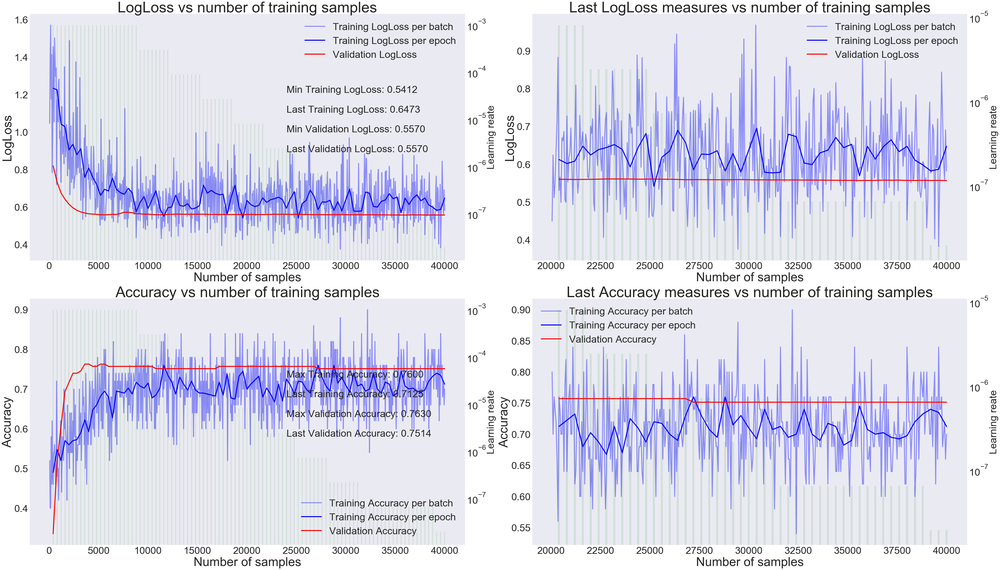

In [1328]:
model_nn2 = nn_model()
model_save_callback_nn2 = ModelSave(use_metric='loss')
K.set_value(model_nn.optimizer.lr, 0.1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.3,
              patience=8, min_lr=0.00000000001)
start_time = time.monotonic()
model_nn2.fit_generator(batches_aug_nn, epochs=100, 
                            steps_per_epoch = batches_aug_nn.n_batches,
                            validation_data=(X_val_f,Y_val_cat),
                            #validation_data= val_batches_nn, 
                            #validation_steps = val_batches_nn.n_batches, 
                            verbose=0,
                       callbacks = [reduce_lr,history_callback, model_save_callback_nn2]
                           )
model_time = time.monotonic() - start_time
print("Model training time: " + '{:d}'.format(int(model_time // 60)) + " minutes " 
      + '{:.1f}'.format(model_time % 60) + " seconds")
plot_metrics(history_callback, show_range=[0.5, 1], unit='samples')
plt.tight_layout()

### Convolution Net

Model training time: 0 minutes 42.5 seconds


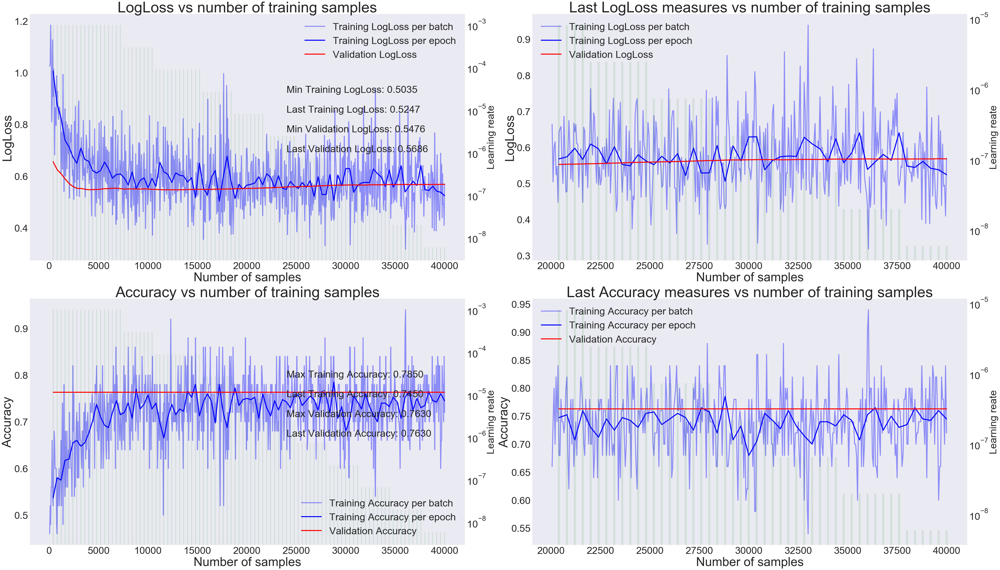

In [1329]:
model_cnn2 = cnn_model()
model_save_callback_cnn2 = ModelSave(use_metric='loss')
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.3,
              patience=8, min_lr=0.000000000001)
start_time = time.monotonic()
model_cnn2.fit_generator(batches_aug, epochs=100, 
                            steps_per_epoch = train_batches,
                            validation_data=(X_val_f.reshape(-1,X_val_f.shape[1],1),Y_val_cat),
                            #validation_data=val_batches, 
                            #validation_steps = len(X_val) // batch_size, 
                            verbose=0,
                       callbacks = [reduce_lr,history_callback, model_save_callback_cnn2]
                           )
model_time = time.monotonic() - start_time
print("Model training time: " + '{:d}'.format(int(model_time // 60)) + " minutes " 
      + '{:.1f}'.format(model_time % 60) + " seconds")
plot_metrics(history_callback, show_range=[0.5, 1], unit='samples')
plt.tight_layout()

### ConvNet training

In [638]:
history = History()
model = train_single_model(model,history=history, 
                           epochs_per_each_step=12,
                           epochs_last_step=0,
                           steps=[0,10],
                           lr_decrease_after_steps=2
                          )

Starting with default learning rate.
Fitting step: 1
Add data augmentation
Epoch 1/12
8/8 [==============================] - 6s - loss: 0.9752 - acc: 0.5225 - val_loss: 0.6736 - val_acc: 0.7733
Epoch 2/12
8/8 [==============================] - 0s - loss: 0.8030 - acc: 0.5900 - val_loss: 0.6441 - val_acc: 0.7733
Epoch 3/12
8/8 [==============================] - 0s - loss: 0.7012 - acc: 0.6200 - val_loss: 0.6237 - val_acc: 0.7600
Epoch 4/12
8/8 [==============================] - 1s - loss: 0.6468 - acc: 0.6775 - val_loss: 0.5884 - val_acc: 0.7733
Epoch 5/12
8/8 [==============================] - 0s - loss: 0.6757 - acc: 0.6950 - val_loss: 0.6080 - val_acc: 0.7133
Epoch 6/12
8/8 [==============================] - 1s - loss: 0.6610 - acc: 0.6600 - val_loss: 0.5502 - val_acc: 0.8067
Epoch 7/12
8/8 [==============================] - 0s - loss: 0.5561 - acc: 0.7525 - val_loss: 0.5619 - val_acc: 0.7867
Epoch 8/12
8/8 [==============================] - 0s - loss: 0.5517 - acc: 0.7625 - val_loss

In [483]:
pickle_dump(history,'cnn-train-history-dump')

Now let's look at loss function and accuracy charts during training. Training Loss and accuracy was logged after each batch and Validation Loss and accuracy after every epoch.

In [1200]:
def plot_metric(x1, x2, y1, y2, y3, lr=None, kind='LogLoss', func_type='Min', 
                label1='Training', label2='Validation', subplot_loc=1,
               title=None,annotations=True,
               unit = 'images'):
    """Creates a plot for a given metric"""
    if (func_type == 'Min'):
        func = np.min
    elif (func_type == 'Max'):
        func = np.max
    plt.subplot(2,2,subplot_loc)
    plt.plot(x1, y1, color = 'b', label = label1 + ' ' + kind + ' per batch', linewidth=4, alpha=0.4)
    plt.plot(x2, y3, color = 'b', label = label1 + ' ' + kind + ' per epoch', linewidth=4)
    plt.plot(x2, y2, color='r', label = label2 + ' ' + kind, linewidth=4)
    if (lr != None):
        ax = plt.gca()
        ax1 = ax.twinx()
        ax1.bar(x2,lr, color = 'g', label = 'Learning rate')
    if (title == None):
        plt.title(kind + ' vs number of training ' + unit, fontsize=60)
    else:
        plt.title(title + ' vs number of training ' + unit, fontsize=60)
    plt.xlabel('Number of ' + unit, fontsize=50)
    plt.ylabel(kind, fontsize=50)
    if (annotations):
        axes = plt.gca()
        y_min = axes.get_ylim()[0]
        y_range = axes.get_ylim()[1] - y_min
        plt.annotate(func_type + " " + label1 + " " + kind + ": " + '{:.4f}'.format(func(y1)), 
                 xy=(np.max(x1) * 0.6, y_min + y_range * 0.7),
                 fontsize=40, clip_on=True)
        plt.annotate("Last " + label1 + " " + kind + ": "  + '{:.4f}'.format(y1[-1]), 
                 xy=(np.max(x1) * 0.6, y_min + y_range * 0.6),
                 fontsize=40, clip_on=True) 
        plt.annotate(func_type + " " + label2 + " " + kind + ": " + '{:.4f}'.format(func(y2)), 
                 xy=(np.max(x1) * 0.6, y_min + y_range * 0.5),
                 fontsize=40, clip_on=True)
        plt.annotate("Last " + label2 + " " + kind + ": "  + '{:.4f}'.format(y2[-1]), 
                 xy=(np.max(x1) * 0.6, y_min + y_range * 0.4),
                 fontsize=40, clip_on=True)    
    plt.legend(loc='best', fontsize=40)
    plt.tick_params(axis='both', which='major', labelsize=40)

In [1211]:
def plot_metrics(history, last_perc=0.25, unit='sample'):
    """Creates plots for all logged metrics in history object"""
    #x_batches for batches
    x_batches = np.cumsum(history.batches_size)
    #x_epochs
    #x_epochs = range(len(history.loss) // len(history.val_loss),len(history.loss) + 1, len(history.loss) // len(history.val_loss))
    x_epochs = np.cumsum(history.img_shown)
    last_batches = int(len(x_batches) * last_perc)
    last_epochs = int(len(x_epochs) * last_perc)

    plt.figure(figsize=(56,32))
    plot_metric(x_batches, x_epochs, history.loss, history.val_loss, history.epoch_loss, 
                history.epoch_lr, unit = unit
               )

    plot_metric(x_batches[-last_batches:], x_epochs[-last_epochs:], 
                history.loss[-last_batches:], 
                history.val_loss[-last_epochs:],
                history.epoch_loss[-last_epochs:],
                history.epoch_lr,
                kind = 'LogLoss', func_type="Max", subplot_loc=2,
                title = 'Last LogLoss measures',
                annotations=False, unit = unit
               )
    plot_metric(x_batches, x_epochs, history.accuracy, history.val_accuracy, history.epoch_accuracy,
                history.epoch_lr,
                kind = 'Accuracy', func_type="Max", subplot_loc=3, unit = unit
               )
    plot_metric(x_batches[-last_batches:], x_epochs[-last_epochs:], 
                history.accuracy[-last_batches:], 
                history.val_accuracy[-last_epochs:],
                history.epoch_accuracy[-last_epochs:],
                history.epoch_lr,
                kind = 'Accuracy', func_type="Max", subplot_loc=4,
                title = 'Last Accuracy measures',
                annotations=False, unit = unit
               )

In [1206]:
#Plot the loss curves for training and validation
plot_metrics(history_callback, last_perc = 0.4)
plt.tight_layout()

AttributeError: 'LossHistory' object has no attribute 'history'

We can see that the model is heavily overfitting up to around 400 batches and then quickly improves.

We can visualize kernels for the first convolution layer as well as it's output to see how our model "sees" the numbers.

In [487]:
def plot_layer(x, n_row, n_col , use_grid=False, start_cell=0):
    for j in range(min(len(x),n_row*n_col)):
        if (not use_grid):
            plt.subplot(n_row, n_col, start_cell+j+1)
        else:
            plt.subplot2grid((n_row, n_col), ((start_cell + j) // n_col - 1, (start_cell + j) % n_row), colspan=8) 
        plt.imshow(x[j], cmap=plt.get_cmap('gray'))
        plt.axis('off')
    #plt.tight_layout()
    return plt

In [488]:
#np.moveaxis(K.get_session().run(model.layers[1].kernel),2,0)

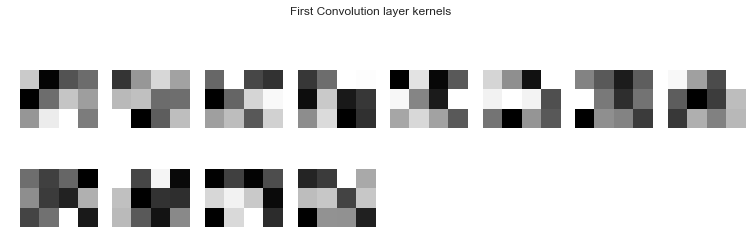

In [640]:
plt.figure(figsize=(13,7))
kernels = np.moveaxis(np.moveaxis(K.get_session().run(model.layers[1].kernel),2,0),2,1)
plot_layer(kernels,4,8)
plt.suptitle('First Convolution layer kernels')
plt.show()

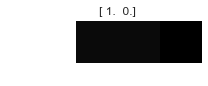

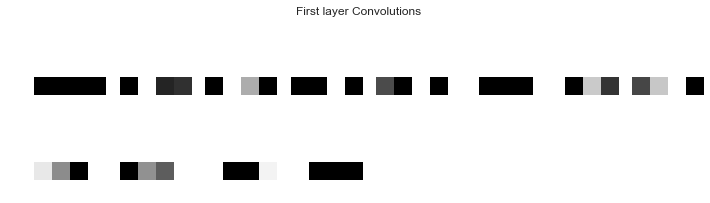

In [641]:
#get random training image
img_id = np.random.randint(len(X_train))
img = X_train[img_id]
#plt.subplots(5,8,figsize=(12,6))
#ax1 = plt.subplot2grid((5, 8), (0, 0), colspan=8)
plt.figure(figsize=(3,3))
plt.imshow(img.reshape(1,4), cmap=plt.get_cmap('gray'))
plt.axis('off')
plt.title(Y_train_cat[img_id])
plt.show()

output0 = model.layers[0].output
input0 = model.layers[0].input
output1 = model.layers[1].output
input1 = model.layers[1].input

activations0 = K.get_session().run(output0, feed_dict={input0:img.astype(np.float32).reshape(1,4,1)})
activations1 = K.get_session().run(output1, feed_dict={input1:activations0})
activations0 = np.moveaxis(activations0,2,0)
activations1 = np.moveaxis(activations1,2,0)
plt.figure(figsize=(12,6))
plot_layer(activations1,4,8)
plt.suptitle('First layer Convolutions')
plt.show()

Continue learning

In [491]:
activations1.shape

(24, 1, 4)

### <a name="ensembling"></a>4.3 Ensembling

In [492]:
def fit_model_and_save(model,ver=1,num=1,history=[],epochs_per_each_step=2, epochs_last_step=3,
                       steps=2,
                       start_lr=None, lr_decrease_after_steps=1):
    print("Training model: " + str(num))
    temp_history = History()
    model_save_callback.Reset()
    model = fit_model(model, 
                      epochs_per_each_step=epochs_per_each_step,
                      epochs_last_step=epochs_last_step,
                      steps=steps,
                      use_train_batches = train_batches,
                      history_callback = history_callback,
                      model_save_callback=model_save_callback,
                      history=temp_history,
                      start_lr=start_lr,
                      lr_decrease_after_steps=lr_decrease_after_steps
                     )
    #load best model weights
    if (model_save_callback.best_model_weights != None):
        print("\nRetrieving best model weights with validation accuracy: " + str(model_save_callback.max_val_accuracy))
        model.set_weights(model_save_callback.best_model_weights)
    history.append(temp_history) #append metrics for each model to the list
    plot_metrics(temp_history, last_perc=0.4) #plot loss and accuracy curves for a finished model
    plt.show()
    print("Saving weights for model: " + str(num))
    model.save_weights(model_path + 'cnn-mnist-'+str(num)+'-v-' + ver+'.pkl')
    return model

We define a function load_model to be able to load previously trained weights and continue from that point.

In [493]:
def load_model(model,ver="2",num=1):
    model.load_weights(model_path + 'cnn-mnist-'+str(num)+'-v-' + ver+'.pkl')
    return model

In [642]:
num_models = 6
dropouts = [[0,    0.1,  0.1,  0.25, 0.25],
            [0.1,  0.1,  0.1,  0.25, 0.5 ],
            [0.1,  0.25, 0.1,  0.25, 0.5 ],
            [0.1,  0.25, 0.15, 0.5,  0.5 ],
            [0.1,  0.25, 0.15, 0.5,  0.5 ],
            [0.15, 0.25, 0.25, 0.5,  0.75 ]
           ]
models = [cnn_model(x) for x in dropouts]

In [643]:
pickle_dump(dropouts,'cnn-dropouts-dump')

In [644]:
#models = [load_model(m,ver=1,num=i) for i,m in enumerate(models)]

In [645]:
histories = History()

In [646]:
start_time = time.time()

Training model: 0
Starting with default learning rate.
Fitting step: 1
Add data augmentation
Epoch 1/8
8/8 [==============================] - 9s - loss: 0.9523 - acc: 0.5650 - val_loss: 0.6688 - val_acc: 0.7867
Epoch 2/8
8/8 [==============================] - 1s - loss: 0.8744 - acc: 0.5850 - val_loss: 0.6252 - val_acc: 0.8133
Epoch 3/8
8/8 [==============================] - 0s - loss: 0.7024 - acc: 0.6775 - val_loss: 0.5972 - val_acc: 0.7867
Epoch 4/8
8/8 [==============================] - 0s - loss: 0.7215 - acc: 0.7000 - val_loss: 0.5840 - val_acc: 0.7933
Epoch 5/8
8/8 [==============================] - 0s - loss: 0.6890 - acc: 0.6800 - val_loss: 0.5894 - val_acc: 0.7667
Epoch 6/8
8/8 [==============================] - 0s - loss: 0.7011 - acc: 0.6725 - val_loss: 0.5826 - val_acc: 0.7600
Epoch 7/8
8/8 [==============================] - 0s - loss: 0.6156 - acc: 0.7325 - val_loss: 0.6142 - val_acc: 0.7000
Epoch 8/8
8/8 [==============================] - 0s - loss: 0.5647 - acc: 0.7625 

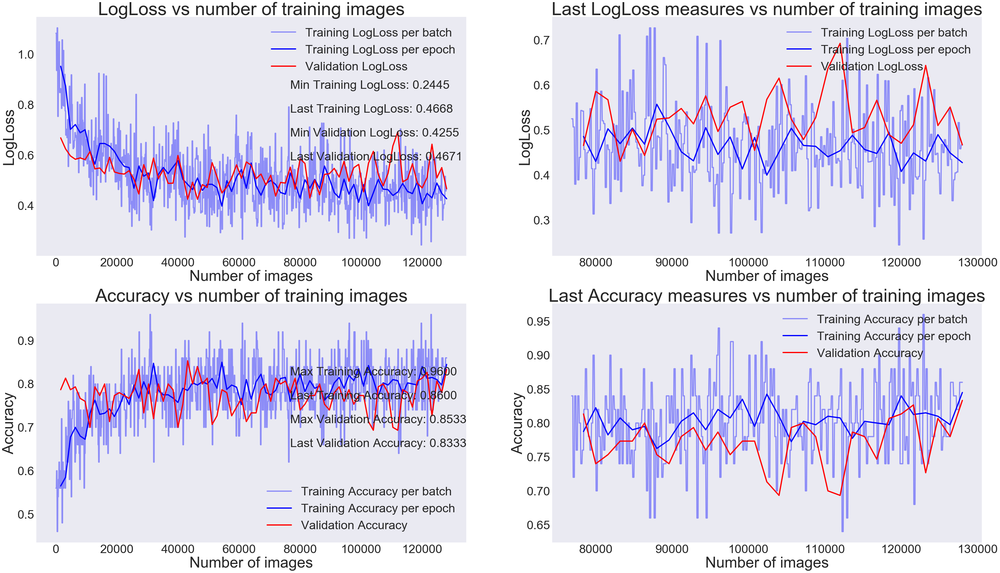

Saving weights for model: 0
Training model: 1
Starting with default learning rate.
Fitting step: 1
Add data augmentation
Epoch 1/8
8/8 [==============================] - 7s - loss: 1.0705 - acc: 0.5025 - val_loss: 0.6678 - val_acc: 0.7000
Epoch 2/8
8/8 [==============================] - 0s - loss: 1.0006 - acc: 0.5500 - val_loss: 0.6341 - val_acc: 0.7400
Epoch 3/8
8/8 [==============================] - 0s - loss: 0.9011 - acc: 0.6175 - val_loss: 0.6054 - val_acc: 0.7600
Epoch 4/8
8/8 [==============================] - 0s - loss: 0.9025 - acc: 0.6075 - val_loss: 0.5953 - val_acc: 0.7600
Epoch 5/8
8/8 [==============================] - 0s - loss: 0.8443 - acc: 0.5825 - val_loss: 0.6085 - val_acc: 0.7267
Epoch 6/8
8/8 [==============================] - 0s - loss: 0.7786 - acc: 0.6400 - val_loss: 0.5732 - val_acc: 0.7800
Epoch 7/8
8/8 [==============================] - 0s - loss: 0.7232 - acc: 0.6475 - val_loss: 0.5820 - val_acc: 0.7533
Epoch 8/8
8/8 [==============================] - 0s -

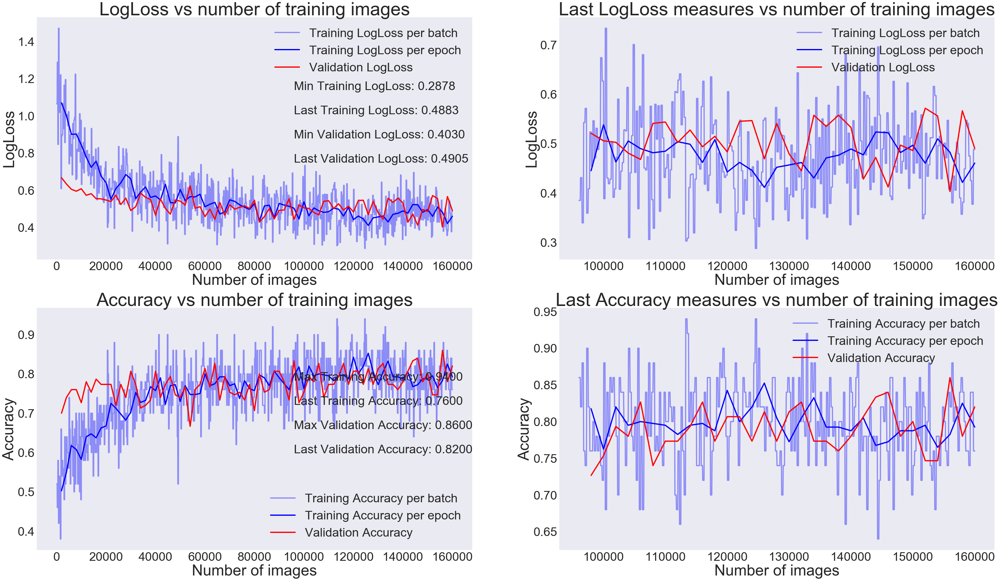

Saving weights for model: 1
Training model: 2
Starting with default learning rate.
Fitting step: 1
Add data augmentation
Epoch 1/8
8/8 [==============================] - 6s - loss: 1.2441 - acc: 0.4925 - val_loss: 0.6701 - val_acc: 0.7600
Epoch 2/8
8/8 [==============================] - 1s - loss: 1.0577 - acc: 0.5625 - val_loss: 0.6411 - val_acc: 0.8133
Epoch 3/8
8/8 [==============================] - 0s - loss: 1.0124 - acc: 0.5675 - val_loss: 0.6151 - val_acc: 0.8133
Epoch 4/8
8/8 [==============================] - 0s - loss: 0.8657 - acc: 0.6475 - val_loss: 0.6143 - val_acc: 0.7467
Epoch 5/8
8/8 [==============================] - 0s - loss: 0.8535 - acc: 0.5925 - val_loss: 0.6240 - val_acc: 0.7067
Epoch 6/8
8/8 [==============================] - 0s - loss: 0.8459 - acc: 0.6175 - val_loss: 0.6057 - val_acc: 0.7333
Epoch 7/8
8/8 [==============================] - 1s - loss: 0.7724 - acc: 0.6200 - val_loss: 0.5809 - val_acc: 0.7733
Epoch 8/8
8/8 [==============================] - 0s -

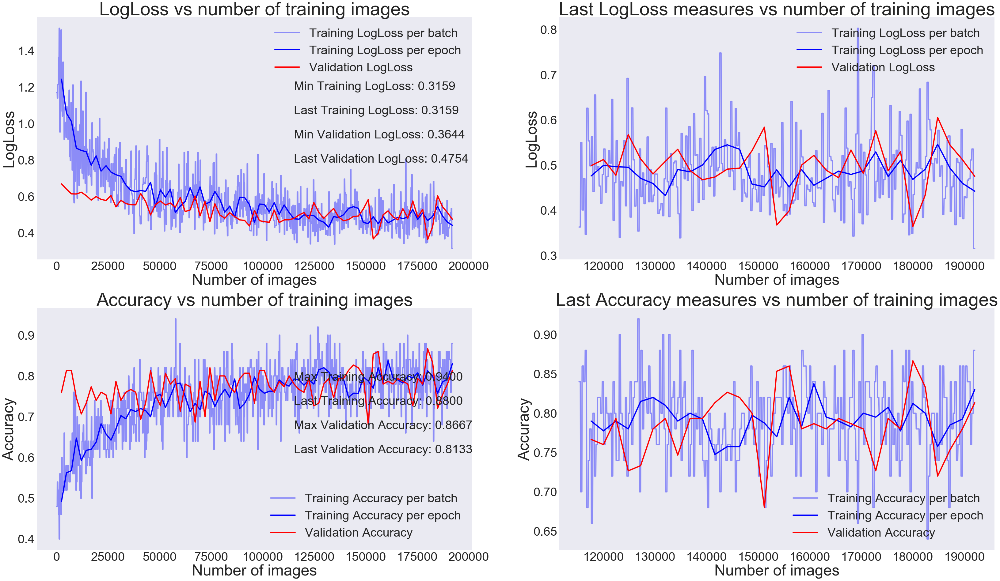

Saving weights for model: 2
Training model: 3
Starting with default learning rate.
Fitting step: 1
Add data augmentation
Epoch 1/8
8/8 [==============================] - 7s - loss: 1.1755 - acc: 0.5375 - val_loss: 0.6739 - val_acc: 0.7533
Epoch 2/8
8/8 [==============================] - 0s - loss: 0.9521 - acc: 0.5575 - val_loss: 0.6470 - val_acc: 0.7467
Epoch 3/8
8/8 [==============================] - 0s - loss: 1.0774 - acc: 0.5725 - val_loss: 0.6259 - val_acc: 0.7533
Epoch 4/8
8/8 [==============================] - 0s - loss: 1.0177 - acc: 0.5400 - val_loss: 0.6019 - val_acc: 0.7667
Epoch 5/8
8/8 [==============================] - 0s - loss: 0.9200 - acc: 0.6150 - val_loss: 0.5853 - val_acc: 0.7667
Epoch 6/8
8/8 [==============================] - 0s - loss: 0.7923 - acc: 0.6150 - val_loss: 0.5768 - val_acc: 0.7600
Epoch 7/8
8/8 [==============================] - 0s - loss: 0.7587 - acc: 0.6650 - val_loss: 0.5380 - val_acc: 0.7933
Epoch 8/8
8/8 [==============================] - 1s -

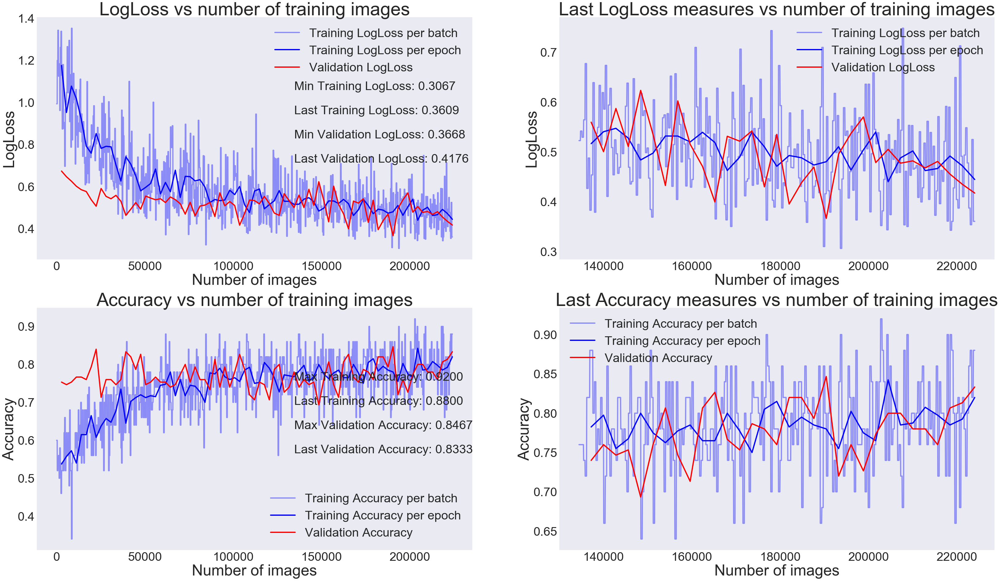

Saving weights for model: 3
Training model: 4
Starting with default learning rate.
Fitting step: 1
Add data augmentation
Epoch 1/8
8/8 [==============================] - 6s - loss: 1.1680 - acc: 0.5250 - val_loss: 0.6606 - val_acc: 0.7733
Epoch 2/8
8/8 [==============================] - 0s - loss: 1.0113 - acc: 0.6175 - val_loss: 0.6432 - val_acc: 0.7267
Epoch 3/8
8/8 [==============================] - 0s - loss: 0.9505 - acc: 0.6075 - val_loss: 0.6125 - val_acc: 0.7600
Epoch 4/8
8/8 [==============================] - 0s - loss: 0.8528 - acc: 0.6150 - val_loss: 0.6025 - val_acc: 0.7467
Epoch 5/8
8/8 [==============================] - 0s - loss: 0.8762 - acc: 0.6075 - val_loss: 0.5955 - val_acc: 0.7467
Epoch 6/8
8/8 [==============================] - 0s - loss: 0.7999 - acc: 0.6300 - val_loss: 0.5907 - val_acc: 0.7467
Epoch 7/8
8/8 [==============================] - 0s - loss: 0.7629 - acc: 0.6450 - val_loss: 0.5853 - val_acc: 0.7600
Epoch 8/8
8/8 [==============================] - 0s -

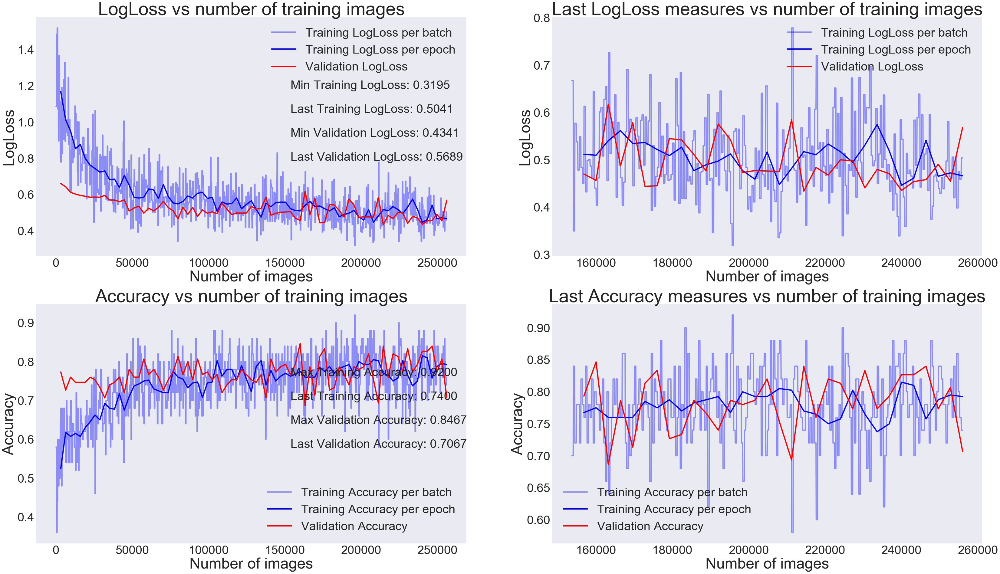

Saving weights for model: 4
Training model: 5
Starting with default learning rate.
Fitting step: 1
Add data augmentation
Epoch 1/8
8/8 [==============================] - 7s - loss: 1.4283 - acc: 0.5400 - val_loss: 0.6572 - val_acc: 0.8000
Epoch 2/8
8/8 [==============================] - 1s - loss: 1.5961 - acc: 0.5350 - val_loss: 0.6217 - val_acc: 0.8133
Epoch 3/8
8/8 [==============================] - 0s - loss: 1.4249 - acc: 0.5650 - val_loss: 0.6145 - val_acc: 0.7733
Epoch 4/8
8/8 [==============================] - 0s - loss: 1.6327 - acc: 0.5175 - val_loss: 0.5742 - val_acc: 0.8400
Epoch 5/8
8/8 [==============================] - 0s - loss: 1.3276 - acc: 0.5500 - val_loss: 0.6065 - val_acc: 0.7467
Epoch 6/8
8/8 [==============================] - 0s - loss: 1.0893 - acc: 0.5900 - val_loss: 0.5789 - val_acc: 0.7733
Epoch 7/8
8/8 [==============================] - 0s - loss: 1.2337 - acc: 0.5625 - val_loss: 0.5621 - val_acc: 0.7933
Epoch 8/8
8/8 [==============================] - 0s -

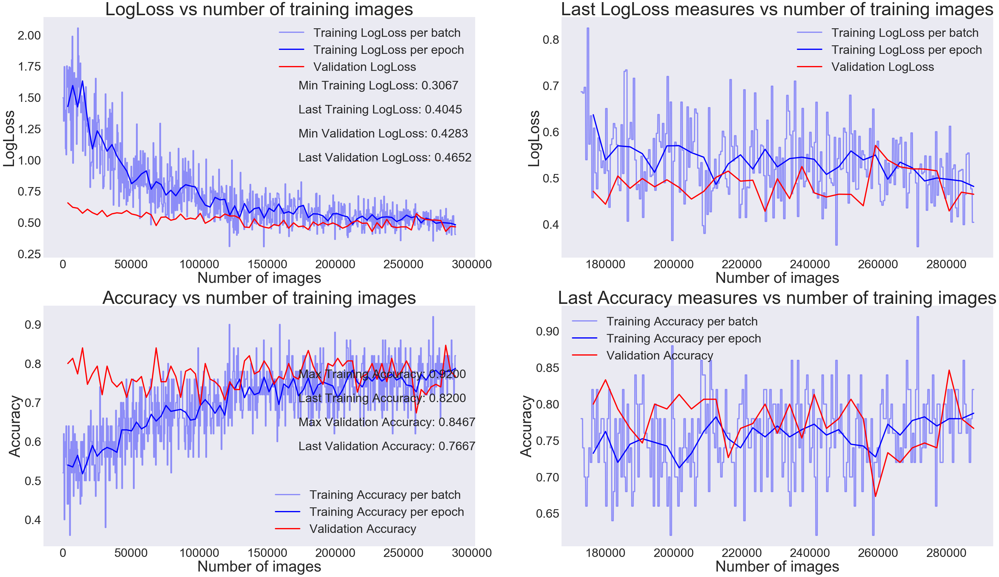

Saving weights for model: 5


In [647]:
models = [fit_model_and_save(m,ver=version,num=i,history=histories,
                             epochs_per_each_step=8,
                             epochs_last_step=0,
                             steps=[0,10],
                             lr_decrease_after_steps=2
                            ) for i,m in enumerate(models)]

In [648]:
elapsed_time = time.time() - start_time
print("Elapsed model ensemble training time: " + str(elapsed_time//60) + " minutes " + str(elapsed_time % 60) + " seconds")

Elapsed model ensemble training time: 10.0 minutes 11.934837579727173 seconds


In [649]:
pickle_dump(histories,'cnn-ensemble-train-histories-dump')

We can add our single trained model to the ensemble.

In [650]:
models_all = models.copy()
models_all.append(model)

In [651]:
models_all

In [652]:
evals = np.array([m.evaluate(X_val.reshape(-1,X_val.shape[1],1), Y_val_cat, batch_size=batch_size) for m in models_all])

173/173 [==============================] - 0s     


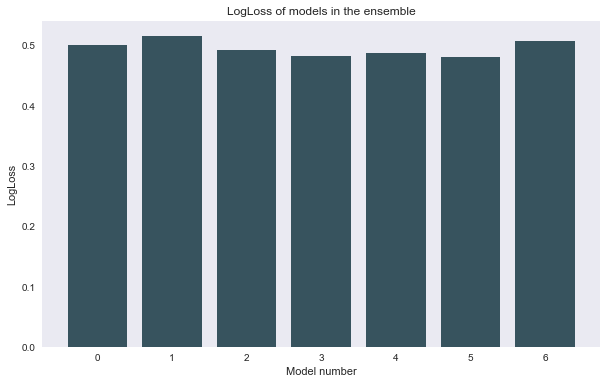

In [698]:
plt.bar(range(len(evals)),evals[:,0])
plt.xlabel('Model number')
plt.ylabel('LogLoss')
plt.title('LogLoss of models in the ensemble')

In [665]:
print("Mean log loss of the ensembled models: " + str(evals.mean(axis=0)[0]))
print("Mean prediction accuracy of the ensembled models: " + str(evals.mean(axis=0)[1]))

Mean log loss of the ensembled models: 0.494844484733
Mean prediction accuracy of the ensembled models: 0.786127143414


In [669]:
print("Min log loss of the ensembled models: " + str(evals.min(axis=0)[0]))
print("Max prediction accuracy of the ensembled models: " + str(evals.max(axis=0)[1]))

Min log loss of the ensembled models: 0.480518088175
Max prediction accuracy of the ensembled models: 0.791907491712


In [695]:
all_preds = np.stack([m.predict(X_val.reshape(-1,X_val.shape[1],1), batch_size=batch_size,verbose=1) for m in models_all])

avg_preds = all_preds.mean(axis=0)
loss = categorical_crossentropy(tf.convert_to_tensor(Y_val_cat), tf.convert_to_tensor(avg_preds.astype(np.float64))).eval(session=K.get_session())
acc = categorical_accuracy(tf.convert_to_tensor(Y_val_cat), tf.convert_to_tensor(avg_preds)).eval(session=K.get_session())
print("\nLog loss of the ensemble of models: " + str(loss.sum()/Y_val_cat.shape[0]))
print("Accuracy of the ensemble of models: " + str(acc.sum()/Y_val_cat.shape[0]))

 50/173 [=======>......................] - ETA: 0sLog loss of the ensemble of models: 0.484342948029
Accuracy of the ensemble of models: 0.78612716763


### Simple NN for the ensemble

In [740]:
def nn_ensemble(dropouts = [0.1,0.1,0.1]):
    model = Sequential([
        Dense(28, activation = 'relu', input_shape=(7,)),
        BatchNormalization(),
        Dropout(dropouts[0]),
        Dense(56, activation = 'relu'),
        BatchNormalization(),
        Dropout(dropouts[1]),
        Dense(56, activation = 'relu'),
        BatchNormalization(),
        Dropout(dropouts[1]),
        Dense(2, activation = 'softmax')
    ])
    model.compile(Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model_ensemble = nn_ensemble()

In [741]:
x_preds = np.moveaxis(all_preds,1,0)[:,:,1]
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
              patience=5, min_lr=0.00000000001)
model_ensemble.fit(x_preds,Y_val_cat, epochs=125, 
                    validation_split=0.3,
                    verbose=1,
                    callbacks=[reduce_lr]
                   )

Train on 121 samples, validate on 52 samples
Epoch 1/125
121/121 [==============================] - 5s - loss: 0.8336 - acc: 0.5289 - val_loss: 0.6655 - val_acc: 0.7885
Epoch 2/125
121/121 [==============================] - 0s - loss: 0.7919 - acc: 0.5950 - val_loss: 0.6524 - val_acc: 0.7885
Epoch 3/125
121/121 [==============================] - 0s - loss: 0.7765 - acc: 0.5950 - val_loss: 0.6369 - val_acc: 0.7885
Epoch 4/125
121/121 [==============================] - 0s - loss: 0.7444 - acc: 0.6033 - val_loss: 0.6201 - val_acc: 0.7885
Epoch 5/125
121/121 [==============================] - 0s - loss: 0.6310 - acc: 0.6694 - val_loss: 0.6039 - val_acc: 0.7885
Epoch 6/125
121/121 [==============================] - 0s - loss: 0.6634 - acc: 0.7025 - val_loss: 0.5911 - val_acc: 0.7885
Epoch 7/125
121/121 [==============================] - ETA: 0s - loss: 0.6627 - acc: 0.750 - 0s - loss: 0.6106 - acc: 0.7603 - val_loss: 0.5811 - val_acc: 0.7885
Epoch 8/125
121/121 [============================

In [706]:
x_preds = np.moveaxis(all_preds,1,0)[:,:,1]
x_preds.shape

(173, 7)

In [670]:
print(all_preds.shape)
np.clip(np.array([np.sum(all_preds[:,x,1] > 0.5)/all_preds.shape[0] for x in range(all_preds.shape[1])]),0.15,0.85)[:5]

(7, 173, 2)


array([ 0.85      ,  0.15      ,  0.71428571,  0.85      ,  0.15      ])

### <a name="confusion-matrix"></a>4.4 Confusion matrix and classification report

In [658]:
#val_preds = model.predict(X_val, batch_size=100,verbose=1)
#use prediction from ensembling
val_preds = avg_preds

Let's first define a function that will plot our confusion matrix.

In [659]:
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    (This function is copied from the scikit docs.)
    """
    plt.figure()
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    print(cm)
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j], horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

[[121  11]
 [ 26  15]]


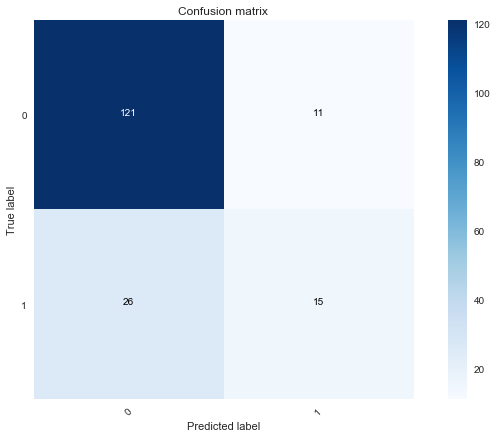

In [660]:
conf_matrix = confusion_matrix(np.argmax(Y_val_cat,axis=1),np.argmax(val_preds,axis=1))
plot_confusion_matrix(conf_matrix, classes=range(2))

Now let's look at f1-score precision and recall to see how our model is performing on each digit.

In [661]:
print(classification_report(np.argmax(Y_val_cat,axis=1),np.argmax(val_preds,axis=1)))

             precision    recall  f1-score   support

          0       0.82      0.92      0.87       132
          1       0.58      0.37      0.45        41

avg / total       0.76      0.79      0.77       173



In [662]:
test.head()

,Months since Last Donation,Number of Donations,Total Volume Donated (c.c.),Months since First Donation
659,2,12,3000,52
276,21,7,1750,38
263,4,1,250,4
303,11,11,2750,38
83,4,12,3000,34


In [680]:
test_preds = np.stack([m.predict(test_n.reshape(-1,test_n.shape[1],1), batch_size=batch_size,verbose=1) for m in models_all])
avg_test_preds = test_preds.mean(axis=0)

maj_vote_preds = np.clip(np.array([
    np.sum(test_preds[:,x,1] > 0.5)/test_preds.shape[0] for x in range(test_preds.shape[1])
]),0.15,0.85)

submission1 = pd.DataFrame({'ImageId':test.index,'Made Donation in March 2007':avg_test_preds[:,1]})
submission = pd.DataFrame({'ImageId':test.index,'Made Donation in March 2007':maj_vote_preds})
submission1.set_index('ImageId',inplace=True)
submission1.index.name = None
submission.set_index('ImageId',inplace=True)
submission.index.name = None
submission.to_csv('submission-s-maj' + version + '.csv')
submission1.to_csv('submission-s-mean' + version + '.csv')
submission.head()

 50/200 [======>.......................] - ETA: 0s

,Made Donation in March 2007
659,0.571429
276,0.150000
263,0.150000
303,0.150000
83,0.850000


In [664]:
submission1.head()

,ImageId,Made Donation in March 2007
0,659,0.549165
1,276,0.165493
2,263,0.193681
3,303,0.184440
4,83,0.641658


In [ ]:
avg_test_preds.shape